In [1]:
%load_ext autoreload
%autoreload 2
import waffles
import numpy as np
import json
import shutil 
from tqdm import tqdm
import mplhep
import matplotlib.pyplot as plt
mplhep.style.use(mplhep.style.ROOT)
plt.rcParams.update({'font.size': 20,
                        'grid.linestyle': '--',
                        'axes.grid': True,
                        'figure.autolayout': True,
                        'figure.figsize': [14,6]
                        })

import waffles
import numpy as np
import json
import shutil 
from tqdm import tqdm

from pathlib import Path

from waffles.input_output.hdf5_structured import load_structured_waveformset
from waffles.data_classes.Waveform import Waveform
from waffles.data_classes.WaveformSet import WaveformSet
from waffles.data_classes.BasicWfAna import BasicWfAna
from waffles.data_classes.IPDict import IPDict
from waffles.data_classes.UniqueChannel import UniqueChannel
from waffles.data_classes.ChannelWsGrid import ChannelWsGrid
from waffles.utils.baseline.baseline import SBaseline
from waffles.np02_utils.AutoMap import generate_ChannelMap, dict_uniqch_to_module, dict_module_to_uniqch, strUch, ordered_channels_membrane, ordered_channels_cathode
from waffles.np02_utils.PlotUtils import np02_gen_grids, plot_grid, plot_detectors, genhist, fithist, runBasicWfAnaNP02

In [2]:
dettype = "cathode"


## Only change if necessary
datadir = f"/eos/experiment/neutplatform/protodune/experiments/ProtoDUNE-VD/commissioning/"
det = "VD_Cathode_PDS" if dettype == "cathode" else "VD_Membrane_PDS"
endpoint = 106 if dettype == "cathode" else 107

# Way to low... keep scrollng
dletter = dettype.upper()[0] # C or M...
group1 = [ f"{dletter}{detnum}({chnum})" for detnum in range(1, 3) for chnum in range(1,3) ]
group2 = [ f"{dletter}{detnum}({chnum})" for detnum in range(3, 5) for chnum in range(1,3) ]
group3 = [ f"{dletter}{detnum}({chnum})" for detnum in range(5, 7) for chnum in range(1,3) ]
group4 = [ f"{dletter}{detnum}({chnum})" for detnum in range(7, 9) for chnum in range(1,3) ]
groupall = group1+group2+group3+group4

list_of_unch = ordered_channels_cathode

In [3]:
from glob import glob
import copy
def open_processed(run, dettype, datadir, channels = None, endpoints=None, nwaveforms=None, mergefiles = False, verbose=True):
    """
    Open the processed waveform set for a given run and detector type.
    """
    try: 
        wfset = load_structured_waveformset(
            f"{datadir}/processed/run{run:0d}_{dettype}/processed_merged_run{run:06d}_structured_{dettype}.hdf5",
            max_to_load=nwaveforms,
            channels_filter=channels,
            endpoint_filter=endpoints
        )
    except:
        files = glob(f"{datadir}/processed/run{run:06d}_{dettype}/processed_*_run{run:06d}_*_{dettype}.hdf5")
        if verbose:
            print("List of files found:")
            print(files)
        if not mergefiles or len(files)==1:
            files = files[0]
            wfset = load_structured_waveformset(files, max_to_load=nwaveforms, channels_filter=channels, endpoint_filter=endpoints, verbose=verbose)
        else: 
            wfset = load_structured_waveformset(files[0], max_to_load=nwaveforms, channels_filter= channels, endpoint_filter=endpoints, verbose=verbose)
            for f in files[1:]:
                tmpwf = load_structured_waveformset(f, max_to_load=nwaveforms, channels_filter= channels, endpoint_filter=endpoints, verbose=verbose)
                wfset.merge(copy.deepcopy(tmpwf))
    return wfset

In [4]:
run = 39105
channels=None

wfset_full = open_processed(run, dettype, datadir, channels=channels, endpoints = [endpoint], nwaveforms=None, verbose=True, mergefiles=False)
wfsetsub = WaveformSet(*wfset_full.waveforms[:20000]) # create a subset for quick access...

List of files found:
['/eos/experiment/neutplatform/protodune/experiments/ProtoDUNE-VD/commissioning//processed/run039105_cathode/processed_np02vd_raw_run039105_0000_df-s05-d0_dw_0_20250824T210850.hdf5.copied_structured_cathode.hdf5', '/eos/experiment/neutplatform/protodune/experiments/ProtoDUNE-VD/commissioning//processed/run039105_cathode/processed_np02vd_raw_run039105_0001_df-s05-d0_dw_0_20250824T233514.hdf5.copied_structured_cathode.hdf5']
📤 load_structured_waveformset returning type: <class 'waffles.data_classes.WaveformSet.WaveformSet'> with 151840 waveforms


1938 1898 6.4e-07


Text(1, 0, 'daq_window_timestamp - timestamp (ticks)')

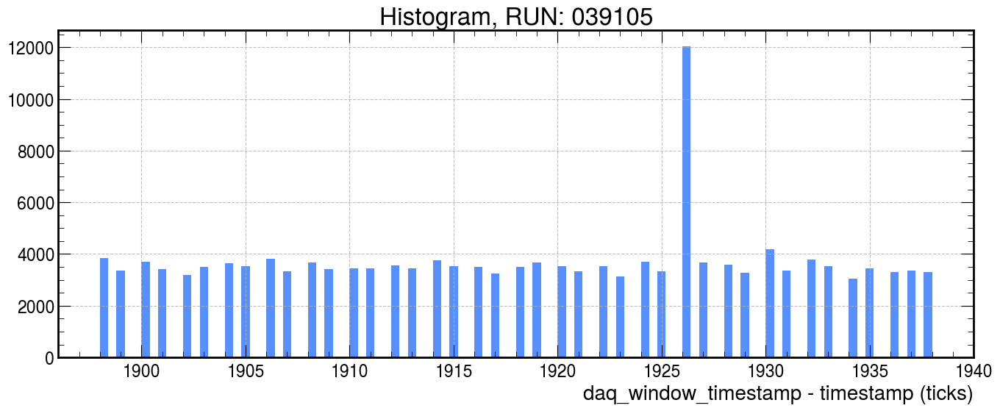

In [5]:
diffvalues = [ wf.daq_window_timestamp - wf.timestamp for wf in wfset_full.waveforms ]
dmax = np.max(diffvalues)
dmin = np.min(diffvalues)
print(dmax, dmin, (dmax-dmin)*16e-9)
hc, hbins, _ = plt.hist(diffvalues, bins=100)
plt.title(f"Histogram, RUN: {run:06d}")
plt.xlabel("daq_window_timestamp - timestamp (ticks)")

In [6]:
def addOffset(waveform: Waveform) -> bool:
    waveform.time_offset = -(waveform.daq_window_timestamp - waveform.timestamp) + 250
    return True

wfset_full = WaveformSet.from_filtered_WaveformSet(wfset_full, addOffset, show_progress=True)

100%|██████████████████████████████████████████████████████████████████████████████████| 151840/151840 [00:00<00:00, 1295448.32it/s]


In [7]:
runBasicWfAnaNP02(wfsetsub, onlyoptimal=False, baselinestart=0, baselinefinish=180, int_ll=185, int_ul=500, amp_ll=180, amp_ul=300, configyaml="")

Processing waveform set with BasicWfAna


100%|███████████████████████████████████████████████████████████████████████████████████████| 20000/20000 [00:10<00:00, 1856.15it/s]


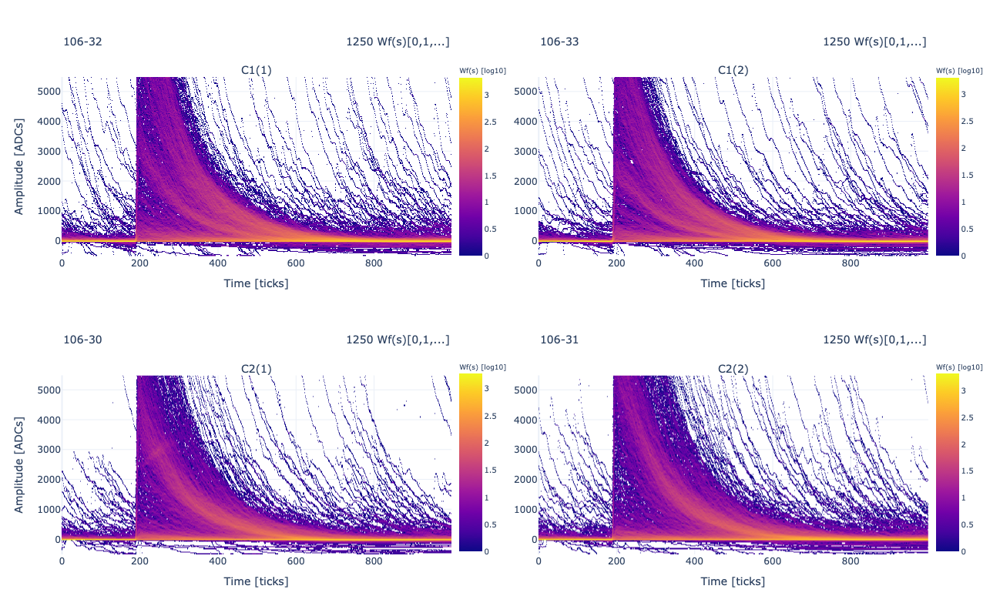

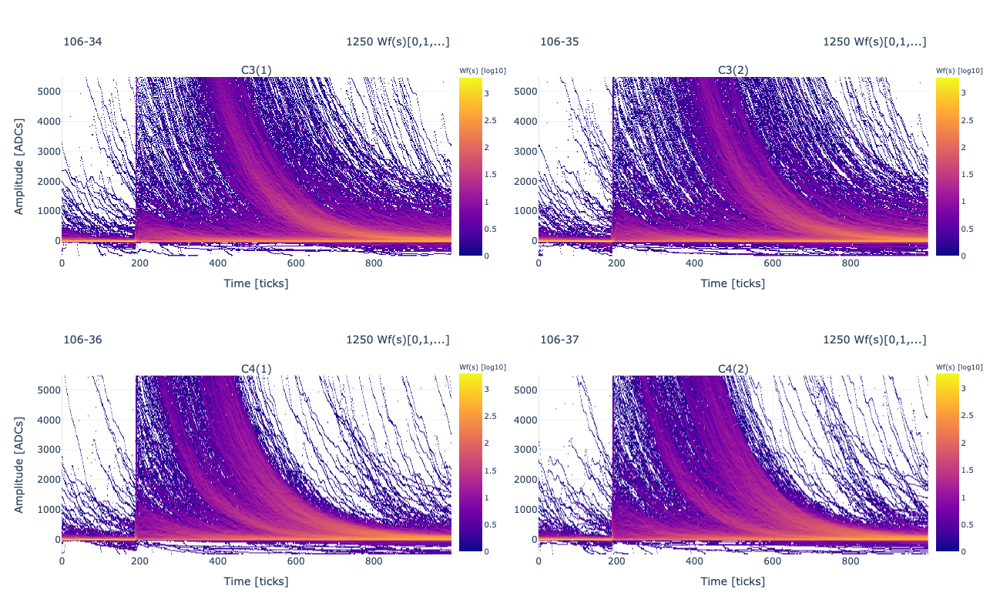

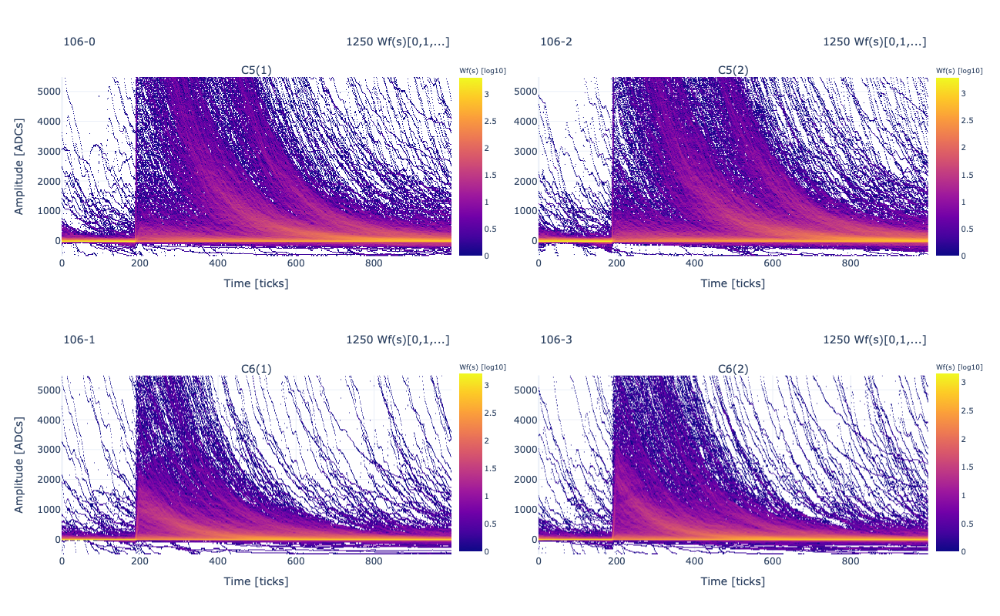

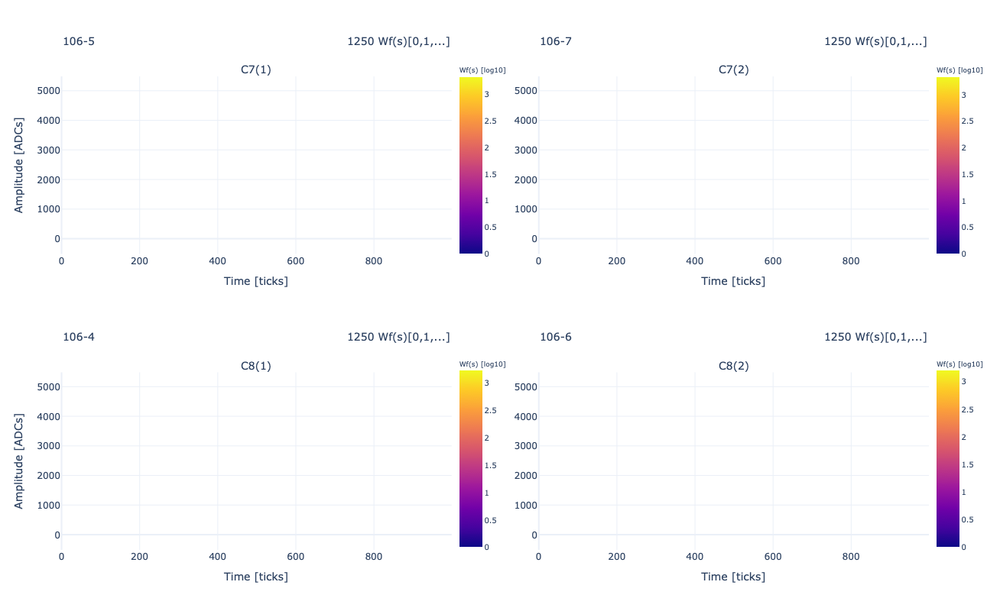

In [8]:
argsheat = dict(
    mode="heatmap",
    analysis_label="std",
    adc_range_above_baseline=5500,
    adc_range_below_baseline=-500,
    adc_bins=200,
    time_bins=1000//2,
    # time_range_lower_limit=triggeroffset-250,
    time_range_upper_limit=1000,
    filtering=0,
    share_y_scale=False,
    share_x_scale=True,
    wfs_per_axes=2000,
    zlog=True
)
detector=group1
plot_detectors(wfsetsub, detector, **argsheat)

detector=group2
plot_detectors(wfsetsub, detector, **argsheat)

detector=group3
plot_detectors(wfsetsub, detector, **argsheat)

detector=group4
plot_detectors(wfsetsub, detector, **argsheat)

In [9]:
runBasicWfAnaNP02(wfset_full, onlyoptimal=True, threshold=50, baselinefinish=180, int_ll=185, int_ul=700, amp_ll=180, amp_ul=300, configyaml="", show_progress=True)

Processing waveform set with BasicWfAna


100%|█████████████████████████████████████████████████████████████████████████████████████| 151840/151840 [00:38<00:00, 3955.23it/s]


In [10]:
def faketrigger(waveform:Waveform) -> bool:
    if waveform.analyses['std'].result['amplitude'] > 100:
        return True
    return False
    
wfset_triggered_all = WaveformSet.from_filtered_WaveformSet(wfset_full, faketrigger, show_progress=True)
wfset_triggered_all

100%|███████████████████████████████████████████████████████████████████████████████████| 151840/151840 [00:00<00:00, 777630.59it/s]


WaveformSet with 116710 waveforms runs: {39105}, points_per_wf: 6336, available_channels: {39105: {106: {0, 1, 2, 3, 4, 5, 6, 7, 34, 35, 36, 37, 32, 33, 30, 31}}}, record_numbers per run: run 39105: 8330 records

In [11]:
particle_by_type = {}
particle_by_type['total'] = 'total'
particle_by_type['HL']   = 'kCTBBeamChkvHL'
particle_by_type['HLx']  = 'kCTBBeamChkvHLx'
particle_by_type['HxLx']  = 'kCTBBeamChkvHxLx'
particle_by_type['HxL'] = 'kCTBBeamChkvHxL'

In [12]:
from tqdm import tqdm
triggertypes = {} # just for checking..
triggergroups = {} # to check if more than one...
triggertypedaq = {}
daqtimestamps = {}
for wf in tqdm(wfset_full.waveforms):
    triggername=wf.trigger_type_names
    firsttime = False
    if wf.daq_window_timestamp not in daqtimestamps:
        firsttime=True
        daqtimestamps[wf.daq_window_timestamp] = 1
        tname = triggername[0]
        triggertypedaq[tname] =  triggertypedaq.get(tname,0) + 1
    else:
        daqtimestamps[wf.daq_window_timestamp] += 1

    if (len(triggername)) > 1:
        raise ValueError("This should never happen!!!!")
    triggergroups[tuple(triggername)] =  triggergroups.get(tuple(triggername), 0) + 1
    for tn in triggername:
        triggertypes[tn] = triggertypes.get(tn, 0) + 1

for triggername in triggertypedaq.keys():
    print(f"Trigger name {triggername} was done {triggertypedaq[triggername]}")# and have total of {triggergroups[tuple([triggername])]}")
print(triggergroups)

100%|████████████████████████████████████████████████████████████████████████████████████| 151840/151840 [00:02<00:00, 71971.83it/s]

Trigger name kCTBBeamChkvHLx was done 4188
Trigger name kCTBBeamChkvHL was done 2423
Trigger name kCTBBeamChkvHxLx was done 2274
Trigger name kCTBOffSpillSnapshot was done 521
Trigger name kCTBBeamSpillStart was done 57
Trigger name kCTBBeamChkvHxL was done 27
{('kCTBBeamChkvHLx',): 67008, ('kCTBBeamChkvHL',): 38768, ('kCTBBeamChkvHxLx',): 36384, ('kCTBOffSpillSnapshot',): 8336, ('kCTBBeamSpillStart',): 912, ('kCTBBeamChkvHxL',): 432}


In [13]:
triggertypedaq['total'] = np.sum( [ value for key, value in triggertypedaq.items() if key not in ['kCTBOffSpillSnapshot', 'kCTBBeamSpillStart', 'total'] ] ) 
triggertypedaq

{'kCTBBeamChkvHLx': 4188,
 'kCTBBeamChkvHL': 2423,
 'kCTBBeamChkvHxLx': 2274,
 'kCTBOffSpillSnapshot': 521,
 'kCTBBeamSpillStart': 57,
 'kCTBBeamChkvHxL': 27,
 'total': np.int64(8912)}

In [14]:
def filter_offspill(waveform: Waveform, specifictype="") -> bool:
    if 'kCTBOffSpillSnapshot' in waveform.trigger_type_names or 'kCTBBeamSpillStart' in waveform.trigger_type_names:
        return False
    return True
def filter_types(waveform: Waveform, specifictype) -> bool:
    if specifictype in waveform.trigger_type_names:
        return True
    return False

def get_particle_wfset(wfset, specifictype):
    try:
        wftmp = WaveformSet.from_filtered_WaveformSet(wfset, filter_types, specifictype, show_progress=False)
        print(specifictype, wftmp)
        return wftmp
    except:
        print(f"{specifictype} not in this run...\n")
        return None
    
def remove_saturated(waveform:Waveform) -> bool:
    if np.any(waveform.adcs[150-waveform.time_offset:1000-waveform.time_offset]>15500):
        return False
    return True

wfset_triggered_types = {}
wfset_triggered_types['total']= WaveformSet.from_filtered_WaveformSet(wfset_triggered_all, filter_offspill, show_progress=True)
print("total...", wfset_triggered_types['total'])
wfset_triggered_types['HL']   = get_particle_wfset(wfset_triggered_types['total'], specifictype = particle_by_type['HL'] )
wfset_triggered_types['HLx']  = get_particle_wfset(wfset_triggered_types['total'], specifictype = particle_by_type['HLx'] )
wfset_triggered_types['HxLx']  = get_particle_wfset(wfset_triggered_types['total'], specifictype = particle_by_type['HxLx'] )
wfset_triggered_types['HxL'] = get_particle_wfset(wfset_triggered_types['total'], specifictype = particle_by_type['HxL'] )

100%|████████████████████████████████████████████████████████████████████████████████████| 116710/116710 [00:03<00:00, 38175.00it/s]


total... WaveformSet with 116065 waveforms runs: {39105}, points_per_wf: 6336, available_channels: {39105: {106: {0, 1, 2, 3, 4, 5, 6, 7, 34, 35, 36, 37, 32, 33, 30, 31}}}, record_numbers per run: run 39105: 8175 records

kCTBBeamChkvHL WaveformSet with 35019 waveforms runs: {39105}, points_per_wf: 6336, available_channels: {39105: {106: {0, 1, 2, 3, 4, 5, 6, 7, 34, 35, 36, 37, 32, 33, 30, 31}}}, record_numbers per run: run 39105: 2343 records

kCTBBeamChkvHLx WaveformSet with 59185 waveforms runs: {39105}, points_per_wf: 6336, available_channels: {39105: {106: {0, 1, 2, 3, 4, 5, 6, 7, 34, 35, 36, 37, 32, 33, 30, 31}}}, record_numbers per run: run 39105: 4086 records

kCTBBeamChkvHxLx WaveformSet with 21751 waveforms runs: {39105}, points_per_wf: 6336, available_channels: {39105: {106: {0, 1, 2, 3, 4, 5, 6, 7, 34, 35, 36, 37, 32, 33, 30, 31}}}, record_numbers per run: run 39105: 1733 records

kCTBBeamChkvHxL WaveformSet with 110 waveforms runs: {39105}, points_per_wf: 6336, available_c

In [15]:
def processes_analysis_by_type(wfset, dkey, daqtriggerdict:dict, output_infos, verbose=True):
    
    global list_of_unch
    global particle_by_type
    output_infos[dkey] = {}
    output_infos[dkey]['DAQ_Trigger'] = {}
    output_infos[dkey]['Triggered_Events'] = {}
    output_infos[dkey]['Percent_trigger'] = {}
    output_infos[dkey]['No_saturated'] = {}
    output_infos[dkey]['Percent_nonsat'] = {}
    output_infos[dkey]['Charge'] = {}
    output_infos[dkey]['wfsetnosat'] = {}
    quantile = [0.02, 0.98]

    for ch in list_of_unch: #inital values all set 
        output_infos[dkey]['DAQ_Trigger'][ch] = 0
        output_infos[dkey]['Triggered_Events'][ch] = 0
        output_infos[dkey]['Percent_trigger'][ch] = 0
        output_infos[dkey]['No_saturated'][ch] = 0
        output_infos[dkey]['Percent_nonsat'][ch] = 0
        output_infos[dkey]['Charge'][ch] = 0
        output_infos[dkey]['wfsetnosat'][ch] = None
        

    if wfset is None:
        return
    daqtrigger = daqtriggerdict[particle_by_type[dkey]]
    chwfob = ChannelWsGrid.clusterize_waveform_set(wfset)
    if verbose:
        print("\nTriggered channels 'efficiency'")
        print("Module, n records, n DAQ triggers, %")
    nbeamrecors_ch_triggered = {}
    for ep, wfsch in chwfob.items():
        for ch in list_of_unch:
            if ch not in wfsch:
                nbeamrecors_ch_triggered[ch] = 0
            else:
                recordschob = len(wfsch[ch].record_numbers[run])
                nbeamrecors_ch_triggered[ch] = recordschob
                if len(wfsch[ch].waveforms) != recordschob:
                    raise ValueError("This should never happen...")
            if verbose:
                print(f"{dict_uniqch_to_module[str(UniqueChannel(ep,ch))]}, {nbeamrecors_ch_triggered[ch]}, {daqtrigger}, {100*nbeamrecors_ch_triggered[ch]/daqtrigger:.2f}%")
            output_infos[dkey]['DAQ_Trigger'][ch] = daqtrigger
            output_infos[dkey]['Triggered_Events'][ch] = nbeamrecors_ch_triggered[ch]
            output_infos[dkey]['Percent_trigger'][ch] = 100*nbeamrecors_ch_triggered[ch]/daqtrigger if daqtrigger != 0 else 0

    wfset_onbeam_nonsat = WaveformSet.from_filtered_WaveformSet(wfset, remove_saturated, show_progress=False)
    wfset = WaveformSet.from_filtered_WaveformSet(wfset, addOffset, show_progress=True)

    chwfob_ns = ChannelWsGrid.clusterize_waveform_set(wfset_onbeam_nonsat)
    list_of_devices = sorted([ m for m in dict_module_to_uniqch.keys() if m ])
    list_of_unch = [ dict_module_to_uniqch[m].channel for m in list_of_devices if dict_module_to_uniqch[m].endpoint == endpoint ]
    if verbose:
        print("\nTriggered channels saturation")
        print("Module, n not saturated, n triggers, %")
    nbeamrecors_ch_triggered_nosat = {}
    for ep, wfsch in chwfob_ns.items():
        for ch in list_of_unch:
            meancharge = 0
            if ch not in wfsch:
                nbeamrecors_ch_triggered_nosat[ch] = 0
            else:
                recordschob = len(wfsch[ch].record_numbers[run])
                nbeamrecors_ch_triggered_nosat[ch] = recordschob
                if len(wfsch[ch].waveforms) != recordschob:
                    raise ValueError("This should never happen...")
                charges = np.array([ wf.analyses['std'].result['integral'] for wf in chwfob_ns[endpoint][ch].waveforms if wf.analyses['std'].result['integral'] is not np.nan ])
                meancharge = np.mean(charges)
                    #stdcharge = np.rms(charges - meancharge) #for deeper analysis - std
                '''
                #QUANTILE
                if len(charges) > 5:
                    lowq, highq = np.quantile(charges, quantile)
                    charges_clean = charges[(charges > lowq) & (charges < highq)]
                    meancharge = np.mean(charges_clean)
                '''                
            nperc = 0 if nbeamrecors_ch_triggered[ch] ==0 else 100*nbeamrecors_ch_triggered_nosat[ch]/nbeamrecors_ch_triggered[ch]
            if verbose:
                print(f"{dict_uniqch_to_module[str(UniqueChannel(ep,ch))]}, {nbeamrecors_ch_triggered_nosat[ch]}, {nbeamrecors_ch_triggered[ch]}, {nperc:.2f}%")

            output_infos[dkey]['No_saturated'][ch] = nbeamrecors_ch_triggered_nosat[ch]
            output_infos[dkey]['Percent_nonsat'][ch] = nperc
            output_infos[dkey]['Charge'][ch] = meancharge
        output_infos[dkey]['wfsetnosat'] = wfset_onbeam_nonsat
        print("\n")
            
            
output_infos = {}
for dkey, wfset in wfset_triggered_types.items():
    processes_analysis_by_type(wfset, dkey, triggertypedaq, output_infos=output_infos)


Triggered channels 'efficiency'
Module, n records, n DAQ triggers, %
C1(1), 7549, 8912, 84.71%
C1(2), 7490, 8912, 84.04%
C2(1), 7249, 8912, 81.34%
C2(2), 7336, 8912, 82.32%
C3(1), 7483, 8912, 83.97%
C3(2), 7455, 8912, 83.65%
C4(1), 7631, 8912, 85.63%
C4(2), 7635, 8912, 85.67%
C5(1), 7326, 8912, 82.20%
C5(2), 7345, 8912, 82.42%
C6(1), 6577, 8912, 73.80%
C6(2), 6737, 8912, 75.59%
C7(1), 7119, 8912, 79.88%
C7(2), 7152, 8912, 80.25%
C8(1), 6975, 8912, 78.27%
C8(2), 7006, 8912, 78.61%


100%|██████████████████████████████████████████████████████████████████████████████████| 116065/116065 [00:00<00:00, 1068181.34it/s]



Triggered channels saturation
Module, n not saturated, n triggers, %
C1(1), 6575, 7549, 87.10%
C1(2), 7305, 7490, 97.53%
C2(1), 6677, 7249, 92.11%
C2(2), 6293, 7336, 85.78%
C3(1), 2246, 7483, 30.01%
C3(2), 2247, 7455, 30.14%
C4(1), 2937, 7631, 38.49%
C4(2), 2846, 7635, 37.28%
C5(1), 3009, 7326, 41.07%
C5(2), 2906, 7345, 39.56%
C6(1), 5950, 6577, 90.47%
C6(2), 5720, 6737, 84.90%
C7(1), 6434, 7119, 90.38%
C7(2), 6199, 7152, 86.68%
C8(1), 6578, 6975, 94.31%
C8(2), 6576, 7006, 93.86%



Triggered channels 'efficiency'
Module, n records, n DAQ triggers, %
C1(1), 2217, 2423, 91.50%
C1(2), 2217, 2423, 91.50%
C2(1), 2204, 2423, 90.96%
C2(2), 2216, 2423, 91.46%
C3(1), 2208, 2423, 91.13%
C3(2), 2201, 2423, 90.84%
C4(1), 2244, 2423, 92.61%
C4(2), 2245, 2423, 92.65%
C5(1), 2176, 2423, 89.81%
C5(2), 2159, 2423, 89.10%
C6(1), 2124, 2423, 87.66%
C6(2), 2143, 2423, 88.44%
C7(1), 2158, 2423, 89.06%
C7(2), 2150, 2423, 88.73%
C8(1), 2179, 2423, 89.93%
C8(2), 2178, 2423, 89.89%


100%|████████████████████████████████████████████████████████████████████████████████████| 35019/35019 [00:00<00:00, 1038251.01it/s]



Triggered channels saturation
Module, n not saturated, n triggers, %
C1(1), 2010, 2217, 90.66%
C1(2), 2186, 2217, 98.60%
C2(1), 2185, 2204, 99.14%
C2(2), 2158, 2216, 97.38%
C3(1), 342, 2208, 15.49%
C3(2), 349, 2201, 15.86%
C4(1), 297, 2244, 13.24%
C4(2), 285, 2245, 12.69%
C5(1), 884, 2176, 40.62%
C5(2), 793, 2159, 36.73%
C6(1), 2075, 2124, 97.69%
C6(2), 2074, 2143, 96.78%
C7(1), 2099, 2158, 97.27%
C7(2), 2071, 2150, 96.33%
C8(1), 2153, 2179, 98.81%
C8(2), 2150, 2178, 98.71%



Triggered channels 'efficiency'
Module, n records, n DAQ triggers, %
C1(1), 3864, 4188, 92.26%
C1(2), 3847, 4188, 91.86%
C2(1), 3724, 4188, 88.92%
C2(2), 3759, 4188, 89.76%
C3(1), 3816, 4188, 91.12%
C3(2), 3806, 4188, 90.88%
C4(1), 3906, 4188, 93.27%
C4(2), 3907, 4188, 93.29%
C5(1), 3728, 4188, 89.02%
C5(2), 3708, 4188, 88.54%
C6(1), 3323, 4188, 79.35%
C6(2), 3419, 4188, 81.64%
C7(1), 3615, 4188, 86.32%
C7(2), 3639, 4188, 86.89%
C8(1), 3559, 4188, 84.98%
C8(2), 3565, 4188, 85.12%


100%|████████████████████████████████████████████████████████████████████████████████████| 59185/59185 [00:00<00:00, 1065567.28it/s]



Triggered channels saturation
Module, n not saturated, n triggers, %
C1(1), 3167, 3864, 81.96%
C1(2), 3711, 3847, 96.46%
C2(1), 3243, 3724, 87.08%
C2(2), 2919, 3759, 77.65%
C3(1), 1162, 3816, 30.45%
C3(2), 1159, 3806, 30.45%
C4(1), 1842, 3906, 47.16%
C4(2), 1777, 3907, 45.48%
C5(1), 1315, 3728, 35.27%
C5(2), 1271, 3708, 34.28%
C6(1), 2797, 3323, 84.17%
C6(2), 2588, 3419, 75.69%
C7(1), 3153, 3615, 87.22%
C7(2), 2972, 3639, 81.67%
C8(1), 3250, 3559, 91.32%
C8(2), 3226, 3565, 90.49%



Triggered channels 'efficiency'
Module, n records, n DAQ triggers, %
C1(1), 1461, 2274, 64.25%
C1(2), 1419, 2274, 62.40%
C2(1), 1314, 2274, 57.78%
C2(2), 1356, 2274, 59.63%
C3(1), 1452, 2274, 63.85%
C3(2), 1440, 2274, 63.32%
C4(1), 1472, 2274, 64.73%
C4(2), 1474, 2274, 64.82%
C5(1), 1414, 2274, 62.18%
C5(2), 1466, 2274, 64.47%
C6(1), 1127, 2274, 49.56%
C6(2), 1172, 2274, 51.54%
C7(1), 1339, 2274, 58.88%
C7(2), 1355, 2274, 59.59%
C8(1), 1231, 2274, 54.13%
C8(2), 1259, 2274, 55.36%


100%|████████████████████████████████████████████████████████████████████████████████████| 21751/21751 [00:00<00:00, 1100061.57it/s]



Triggered channels saturation
Module, n not saturated, n triggers, %
C1(1), 1391, 1461, 95.21%
C1(2), 1401, 1419, 98.73%
C2(1), 1242, 1314, 94.52%
C2(2), 1211, 1356, 89.31%
C3(1), 737, 1452, 50.76%
C3(2), 733, 1440, 50.90%
C4(1), 789, 1472, 53.60%
C4(2), 775, 1474, 52.58%
C5(1), 804, 1414, 56.86%
C5(2), 832, 1466, 56.75%
C6(1), 1077, 1127, 95.56%
C6(2), 1057, 1172, 90.19%
C7(1), 1177, 1339, 87.90%
C7(2), 1150, 1355, 84.87%
C8(1), 1169, 1231, 94.96%
C8(2), 1196, 1259, 95.00%



Triggered channels 'efficiency'
Module, n records, n DAQ triggers, %
C1(1), 7, 27, 25.93%
C1(2), 7, 27, 25.93%
C2(1), 7, 27, 25.93%
C2(2), 5, 27, 18.52%
C3(1), 7, 27, 25.93%
C3(2), 8, 27, 29.63%
C4(1), 9, 27, 33.33%
C4(2), 9, 27, 33.33%
C5(1), 8, 27, 29.63%
C5(2), 12, 27, 44.44%
C6(1), 3, 27, 11.11%
C6(2), 3, 27, 11.11%
C7(1), 7, 27, 25.93%
C7(2), 8, 27, 29.63%
C8(1), 6, 27, 22.22%
C8(2), 4, 27, 14.81%


100%|█████████████████████████████████████████████████████████████████████████████████████████| 110/110 [00:00<00:00, 737018.27it/s]


Triggered channels saturation
Module, n not saturated, n triggers, %
C1(1), 7, 7, 100.00%
C1(2), 7, 7, 100.00%
C2(1), 7, 7, 100.00%
C2(2), 5, 5, 100.00%
C3(1), 5, 7, 71.43%
C3(2), 6, 8, 75.00%
C4(1), 9, 9, 100.00%
C4(2), 9, 9, 100.00%
C5(1), 6, 8, 75.00%
C5(2), 10, 12, 83.33%
C6(1), 1, 3, 33.33%
C6(2), 1, 3, 33.33%
C7(1), 5, 7, 71.43%
C7(2), 6, 8, 75.00%
C8(1), 6, 6, 100.00%
C8(2), 4, 4, 100.00%




In [16]:
mnames = [ mname for mname in list(output_infos['total'])[:-1] ] 
print(', '.join(mnames))
for ttype, outp in output_infos.items():
    
    for ch in list_of_unch:
        for mname in list(output_infos[ttype])[:-1]:
            if mname != "Charge":
                if mname.find("Percent"):
                    print(f"{output_infos[ttype][mname][ch]}", end=", ")
                else:
                    print(f"{output_infos[ttype][mname][ch]:.2f}", end=", ")
                    
            else:
                print(f"{output_infos[ttype][mname][ch]:.2f}")

DAQ_Trigger, Triggered_Events, Percent_trigger, No_saturated, Percent_nonsat, Charge
8912, 7549, 84.71, 6575, 87.10, 8699783.35
8912, 7490, 84.04, 7305, 97.53, 7846548.82
8912, 7249, 81.34, 6677, 92.11, 7031916.38
8912, 7336, 82.32, 6293, 85.78, 8476205.89
8912, 7483, 83.97, 2246, 30.01, 4254451.49
8912, 7455, 83.65, 2247, 30.14, 4493119.49
8912, 7631, 85.63, 2937, 38.49, 7632890.20
8912, 7635, 85.67, 2846, 37.28, 8087258.90
8912, 7326, 82.20, 3009, 41.07, 5515852.70
8912, 7345, 82.42, 2906, 39.56, 5067474.52
8912, 6577, 73.80, 5950, 90.47, 4276393.51
8912, 6737, 75.59, 5720, 84.90, 4501398.65
8912, 7119, 79.88, 6434, 90.38, 7344714.87
8912, 7152, 80.25, 6199, 86.68, 8133993.89
8912, 6975, 78.27, 6578, 94.31, 7013976.29
8912, 7006, 78.61, 6576, 93.86, 7059116.92
2423, 2217, 91.50, 2010, 90.66, 11904931.72
2423, 2217, 91.50, 2186, 98.60, 9773943.79
2423, 2204, 90.96, 2185, 99.14, 7449223.40
2423, 2216, 91.46, 2158, 97.38, 9979554.39
2423, 2208, 91.13, 342, 15.49, 7586765.37
2423, 2201, 

In [ ]:
argsheat = dict(
    mode="heatmap",
    analysis_label="std",
    adc_range_above_baseline=15000,
    adc_range_below_baseline=-2000,
    adc_bins=200,
    time_bins=1000//2,
    time_range_upper_limit=1000,
    filtering=0,
    share_y_scale=False,
    share_x_scale=True,
    wfs_per_axes=2000,
    zlog=True
)

chtrigger='total'
wftmp = output_infos[chtrigger]['wfsetnosat']


detector=group1
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wftmp, detector, html=None, showplots=True, **argsheat)

detector=group2
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wftmp, detector, html=None, showplots=True, **argsheat)

detector=group3
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wftmp, detector, html=None, showplots=True, **argsheat)

detector=group4
longdetname = '_'.join(detector).replace('(','_').replace(')','')
html=Path(f"{run}_{longdetname}_{chtrigger}.html")
plot_detectors(wftmp, detector, html=None, showplots=True, **argsheat)

6894.654967175229


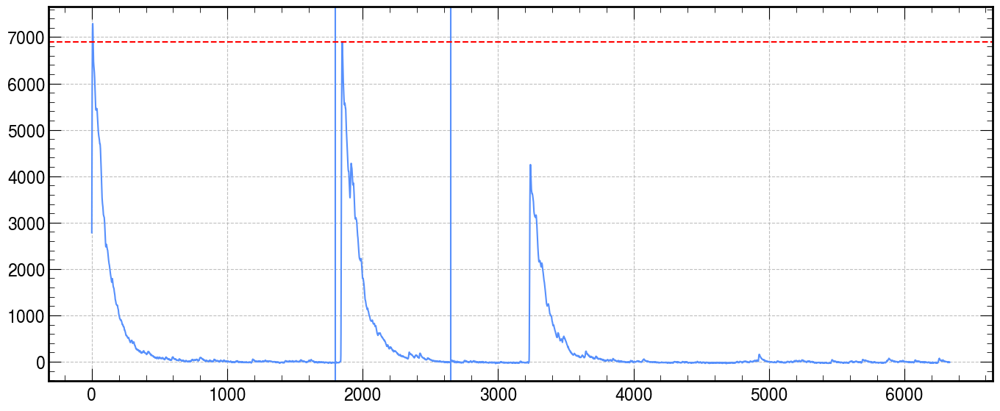

In [18]:
it=0

plt.plot(wftmp.waveforms[it].adcs - wftmp.waveforms[it].analyses['std'].result['baseline'])
plt.axvline(150-wftmp.waveforms[it].time_offset)
plt.axvline(1000-wftmp.waveforms[it].time_offset)
plt.axhline(wftmp.waveforms[it].analyses['std'].result['amplitude'], color='r', ls='--')
print(wftmp.waveforms[it].analyses['std'].result['amplitude'])

In [19]:
#debug
times = [ wf.timestamp*16e-9 for wf in wfset_full.waveforms ]

1756069730.4306653

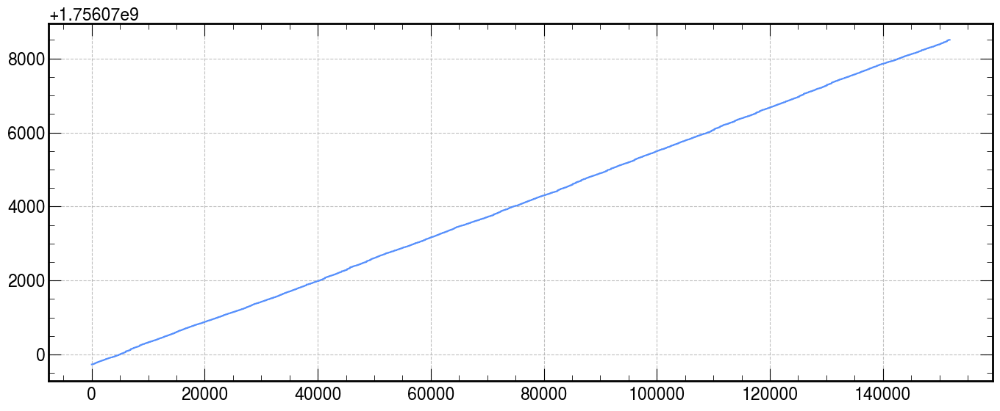

In [20]:
times = sorted(times)
plt.plot(times)
times[0]